In [1]:
# Directories
import os
os.chdir(r"E:\academy\OneDrive - IIT Delhi\3. IIT DELHI\2. Academics\1_PAPER\2_Analysis")
print(os.getcwd())

#Array packages
import cartopy.crs as ccrs
import pandas as pd
import numpy as np
import xarray as xr
import netCDF4 as nc4
from dask.distributed import Client

from scipy.stats import kendalltau
import pymannkendall as mk

#plots
import matplotlib.pyplot as plt
import rioxarray as rio
import geopandas as gpd
from shapely.geometry import mapping
import matplotlib.ticker as ticker
from matplotlib.ticker import MultipleLocator

#Progress meter
from dask.diagnostics import ProgressBar
from tqdm import tqdm

# Directories
import os
import glob
import dask
#import h5netcdf
import scipy


E:\academy\OneDrive - IIT Delhi\3. IIT DELHI\2. Academics\1_PAPER\2_Analysis


ImportError: cannot import name 'is_namedtuple_instance' from 'dask.utils' (C:\Users\sstar\anaconda3\envs\imed\Lib\site-packages\dask\utils.py)

In [149]:
mdl=1
ss=2
rg=0

ssn=['Pre-monsoon','Monsoon','Post-monsoon','Winter']
ssn_m=[[3,4,5],[6,7,8,9],[10,11],[12,1,2]]
model=["LIS_MERRA2","LIS_IMD","LIS_CHIRPS","LIS_ERA5"]
region=['A','B']
reg_lon=[[73,78],[82,85]]
reg_lat=[[20,23],[20,23]]

#Readingg data
lsm_M = xr.open_mfdataset(f"DATA_p/{model[mdl]}_1980_2021.nc",engine='netcdf4', parallel=True,chunks={'time': 'auto'})
lsm_M=lsm_M*60*60*24 #converting to mm/ month
lsm_M=lsm_M.where(lsm_M>=0) 
lsm_M=lsm_M[['TotalPrecip_tavg','Evap_tavg','Qs_tavg']]



In [77]:
#Slicing
#min_lon, max_lon = 73, 78  
i=0
tm=[]
ppt=pd.DataFrame()
q=pd.DataFrame()
et=pd.DataFrame()
re=pd.DataFrame()

#Seasonal 

for i in range(504):
    
    for rg in range(2):
    
        ds=ds.isel(time=i)
        min_lon, max_lon = reg_lon[rg][0],reg_lon[rg][1]
        min_lat, max_lat = reg_lat[rg][0],reg_lat[rg][1]
        ds_sliced = ds.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
        
        ds_ts=ds_sliced.mean(dim=['lat','lon']).compute()
        
        RE=ds_ts["Qs_tavg"]/ds_ts["TotalPrecip_tavg"]
        ds_ts['RE']=RE
        ds_ts=ds_ts.where(ds_ts['RE']<0.8,0)
        #ds_ts=ds_ts.interpolate_na(dim="year", method="linear") # filling nan values
        
        tm.append(ds_ts.time.values)
    

        ppt.loc[i,rg]=ds_ts['TotalPrecip_tavg']
        q.loc[i,rg]=ds_ts['Qs_tavg']
        re.loc[i,rg]=ds_ts['RE']*5
        et.loc[i,rg]=ds_ts['Evap_tavg']
   

C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\4110691122.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(7,5))


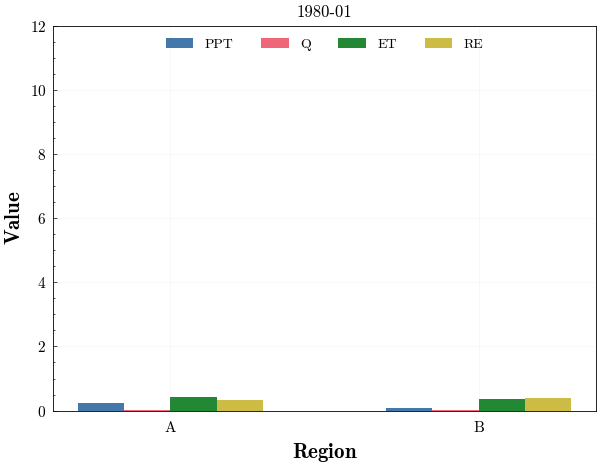

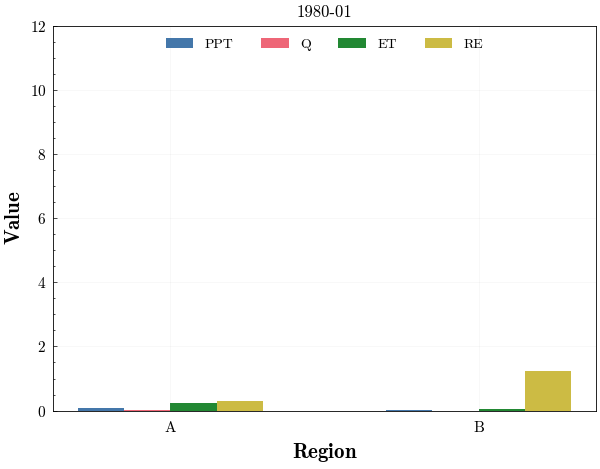

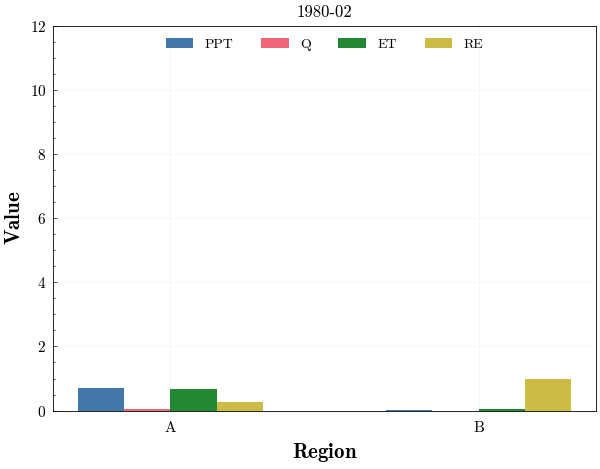

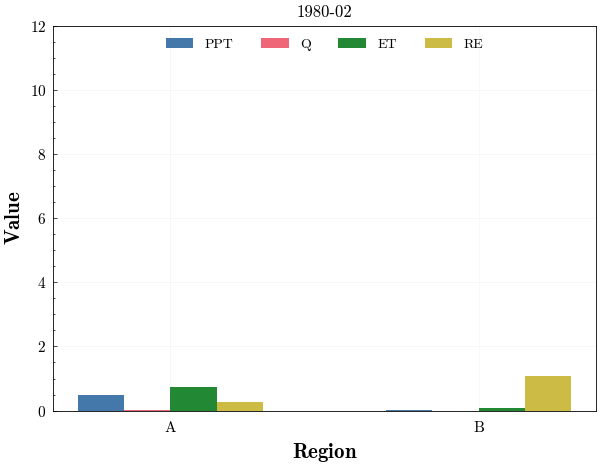

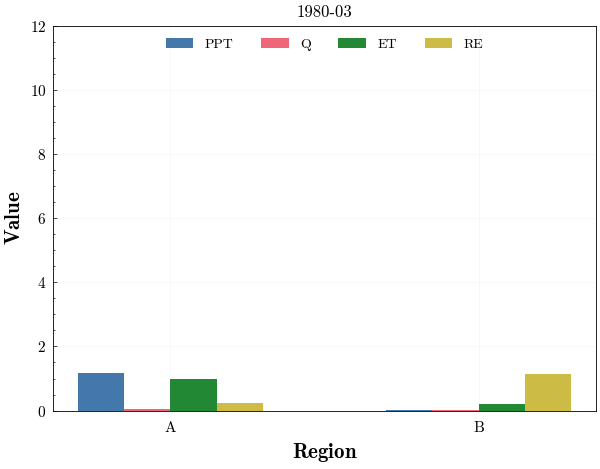

...

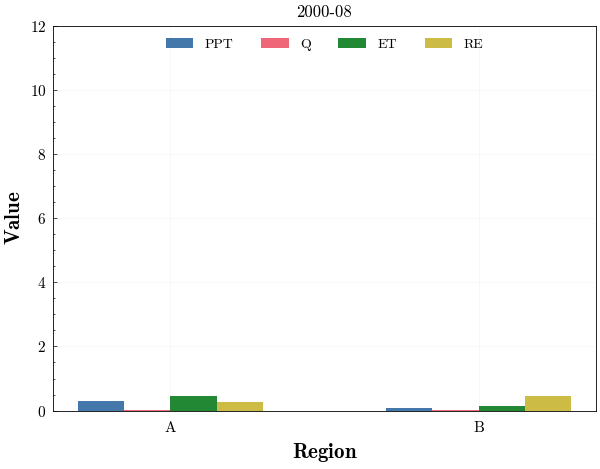

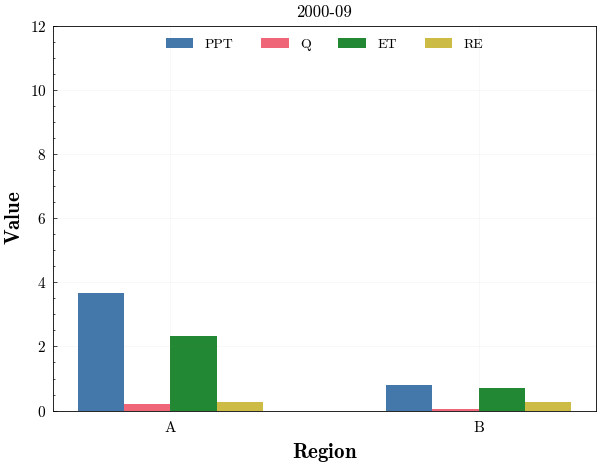

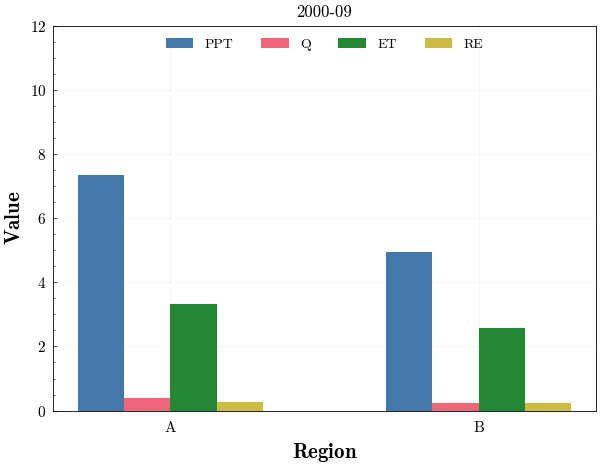

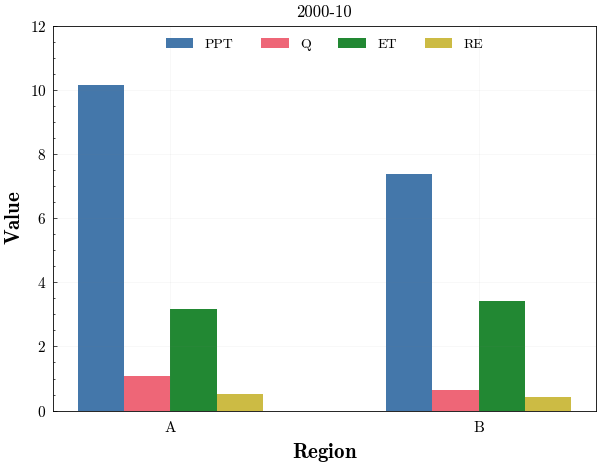

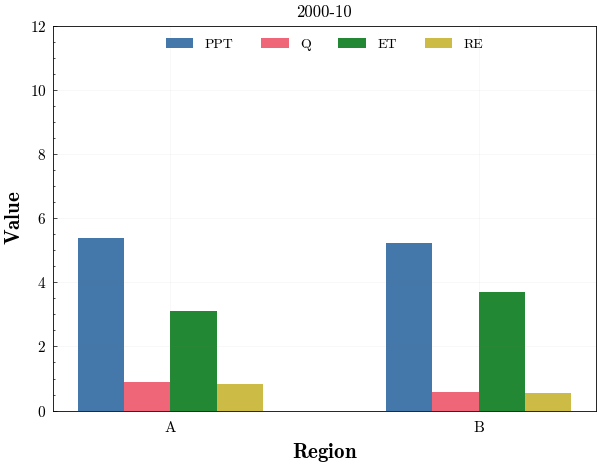

In [81]:
for j in range(500):

    import matplotlib.pyplot as plt
    import numpy as np
    import scienceplots
    plt.style.use(['science','no-latex','bright'])
    
    
    # Sample data
    categories = ['A', 'B']
    values1 = ppt.iloc[j,:]
    values2 = q.iloc[j,:]
    values3 = et.iloc[j,:]
    values4 = re.iloc[j,:]
    
    # Set the positions of the bars on the x-axis
    x = np.arange(len(categories))
    
    # Set the width of the bars
    width = 0.15
    
    # Creating axes object
    fig, ax = plt.subplots(figsize=(7,5))
    [x.set_linewidth(0.6) for x in ax.spines.values()]
    
    # Plotting the bars
    ax.bar(x - 0.225, values1, width, label='PPT')
    ax.bar(x - 0.075, values2, width, label='Q')
    ax.bar(x + 0.075, values3, width, label='ET')
    ax.bar(x + 0.225, values4, width, label='RE')
    
    # Adding labels, title, and custom x-axis tick labels
    ax.set_xlabel('$\mathbf{Region}$',fontsize=15, color='Black')
    ax.set_ylabel('$\mathbf{Value}$',fontsize=15, color='Black')
    ax.set_title(pd.to_datetime(tm[j],format='%d-%m-%Y').strftime('%Y-%m'))
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend()
    
    # Additional settings
    #plt.xticks(np.arange(1980, 2020+1, 5.0),fontsize=8)
    ax.grid(True, color='grey', alpha=0.08)
    ax.set_ylim(0, 12)

    
    # Customizing ticks
    ax.xaxis.set_tick_params(which='both', bottom=False, top=False,labelsize=11,pad=8)
    ax.yaxis.set_tick_params(which='both', left=True, right=False,labelsize=11,pad=5)
    
    # Move legend outside
    ax.legend(loc='upper center',ncol=4)
    
    # Adding value labels on top of the bars
    #for i in range(len(categories)):
        #ax.text(x[i] - width, values1[i] + 0.5, str(round(values1[i], 2)), ha='center')
        #ax.text(x[i], values2[i] + 0.5, str(round(values2[i], 2)), ha='center')
        #ax.text(x[i] + width, values3[i] + 0.5, str(round(values3[i], 2)), ha='center')
            
    # Show plot
    #plt.show()
    #plt.close()
    plt.savefig(f'2_RE analysis/outputs/Gifs/bar_{j}.png')

In [83]:
import imageio
images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{i}.png') for i in range(500)]
imageio.mimsave('2_RE analysis/outputs/ALL.gif', images,duration=500)  

C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\222323633.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{i}.png') for i in range(500)]


# Seasonal

In [162]:
mdl=1
ss=0
##Seasonalizing 
ds=lsm_M
months=ds["time.month"]
ds=ds.sel(time=months.isin(ssn_m[ss]))
ds=ds.groupby("time.year").mean(dim="time")

min_lon, max_lon = reg_lon[rg][0],reg_lon[rg][1]
min_lat, max_lat = reg_lat[rg][0],reg_lat[rg][1]
ds_sliced = ds.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
ds_ts=ds_sliced.mean(dim=['lat','lon']).compute()
RE=ds_ts["Qs_tavg"]/ds_ts["TotalPrecip_tavg"]
ds_ts['RE']=RE
ds_ts=ds_ts.where(ds_ts1['RE']<0.8,0)
np.round(ds_ts['RE'].var().values,5)

0.0

In [174]:
mdl=1
ss=0
##Seasonalizing 
tm=[]
ppt=pd.DataFrame()
q=pd.DataFrame()
et=pd.DataFrame()
re=pd.DataFrame()
var=[0,0]


for ss in range(4):

    ds=lsm_M
    months=ds["time.month"]
    ds=ds.sel(time=months.isin(ssn_m[ss]))
    ds=ds.groupby("time.year").mean(dim="time")
    
    
    for rg in range(2):
        
        min_lon, max_lon = reg_lon[rg][0],reg_lon[rg][1]
        min_lat, max_lat = reg_lat[rg][0],reg_lat[rg][1]
        ds_sliced = ds.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
        ds_ts=ds_sliced.mean(dim=['lat','lon']).compute()
        RE=ds_ts["Qs_tavg"]/ds_ts["TotalPrecip_tavg"]
        ds_ts['RE']=RE
        ds_ts=ds_ts.where(ds_ts1['RE']<0.8,0)
        var[rg]=np.round(ds_ts['RE'].var().values,5)
        
        for i in range(len(ds_ts.year.values)):
            ds_ts1=ds_ts.isel(year=i)
            tm.append(ds_ts1.year.values)

            ppt.loc[i,rg]=ds_ts1['TotalPrecip_tavg']
            q.loc[i,rg]=ds_ts1['Qs_tavg']
            re.loc[i,rg]=ds_ts1['RE']*3
            et.loc[i,rg]=ds_ts1['Evap_tavg']
    
    for j in range(42):
    
        import matplotlib.pyplot as plt
        import numpy as np
        import scienceplots
        plt.style.use(['science','no-latex','bright'])
        
        
        # Sample data
        categories = ['A', 'B']
        values1 = ppt.iloc[j,:]
        values2 = q.iloc[j,:]
        values3 = et.iloc[j,:]
        values4 = re.iloc[j,:]
        
        # Set the positions of the bars on the x-axis
        x = np.arange(len(categories))
        width = 0.15
        fig, ax = plt.subplots(figsize=(7,5))
        [x.set_linewidth(0.6) for x in ax.spines.values()]
        
        # Plotting the bars
        ax.bar(x - 0.225, values1, width, label='PPT')
        ax.bar(x - 0.075, values2, width, label='Q')
        ax.bar(x + 0.075, values3, width, label='ET')
        ax.bar(x + 0.225, values4, width, label='RE')
        
        # Adding labels, title, and custom x-axis tick labels
        ax.set_xlabel('$\mathbf{Region}$',fontsize=15, color='Black')
        ax.set_ylabel('$\mathbf{Value}$',fontsize=15, color='Black')
        ax.set_title(f'{ssn[ss]}_{tm[j]}')
        ax.set_xticks(x)
        ax.set_xticklabels(categories)
        ax.legend()
        
        # Additional settings
        #plt.xticks(np.arange(1980, 2020+1, 5.0),fontsize=8)
        ax.grid(True, color='grey', alpha=0.08)
        ax.set_ylim(0, np.quantile(np.array(ppt.iloc[:,0:2]).flatten(),0.99))
    
        ax.xaxis.set_tick_params(which='both', bottom=False, top=False,labelsize=11,pad=8)
        ax.yaxis.set_tick_params(which='both', left=True, right=False,labelsize=11,pad=5)
        
        # Move legend outside
        ax.legend(loc='upper center',ncol=4)


        ax.text(0.25, 0.92, f'var : {var[0]}', fontsize=12, color='black',ha='right', va='top', transform=ax.transAxes)
        ax.text(0.95, 0.92, f'var : {var[1]}', fontsize=12, color='black',ha='right', va='top', transform=ax.transAxes)
                  
        plt.savefig(f'2_RE analysis/outputs/Gifs/bar_{ssn[ss]}_{j}.png')
        plt.close()

    #GIF MAKING
    import imageio
    images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{ssn[ss]}_{i}.png') for i in range(42)]
    imageio.mimsave(f'2_RE analysis/outputs/gif_{ssn[ss]}.gif', images,duration=420,loop=0) 


C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\1195832678.py:95: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{ssn[ss]}_{i}.png') for i in range(42)]
C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\1195832678.py:95: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{ssn[ss]}_{i}.png') for i in range(42)]
C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\1195832678.py:95: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of 

1.8695707440376281

# SSS

In [ ]:
ssn=['Pre-monsoon','Monsoon','Post-monsoon','Winter']
ssn_m=[[3,4,5],[6,7,8,9],[10,11],[12,1,2]]
model=["LIS_MERRA2","LIS_IMD","LIS_CHIRPS","LIS_ERA5"]
region=['A','B']
reg_lon=[[73,78],[82,85]]
reg_lat=[[20,23],[20,23]]

#Readingg data
lsm_M = xr.open_mfdataset(f"DATA_p/{model[mdl]}_1980_2021.nc",engine='netcdf4', parallel=True,chunks={'time': 'auto'})
lsm_M=lsm_M*60*60*24 #converting to mm/ month
lsm_M=lsm_M.where(lsm_M>=0) 
lsm_M=lsm_M[['TotalPrecip_tavg','Evap_tavg','Qs_tavg']]

C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\798005418.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs=plt.subplots(2,2,figsize=(12,6))


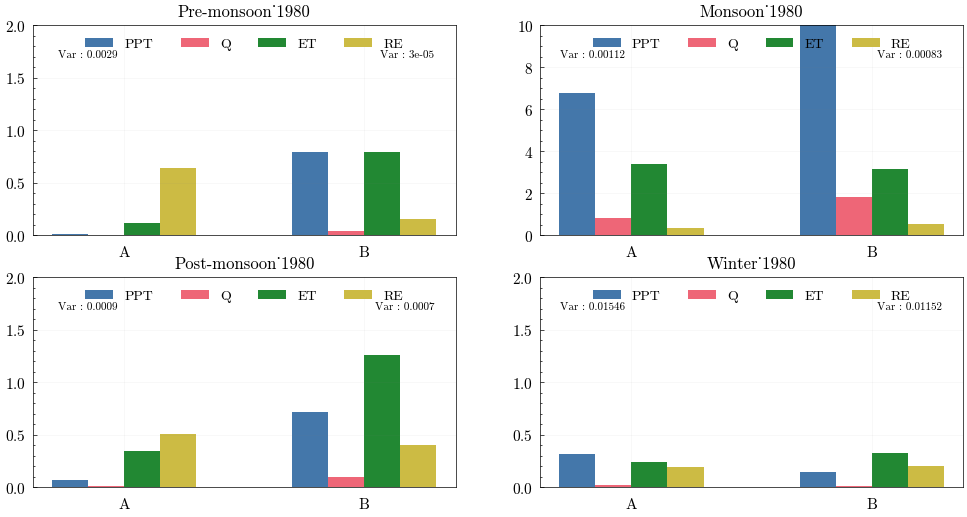

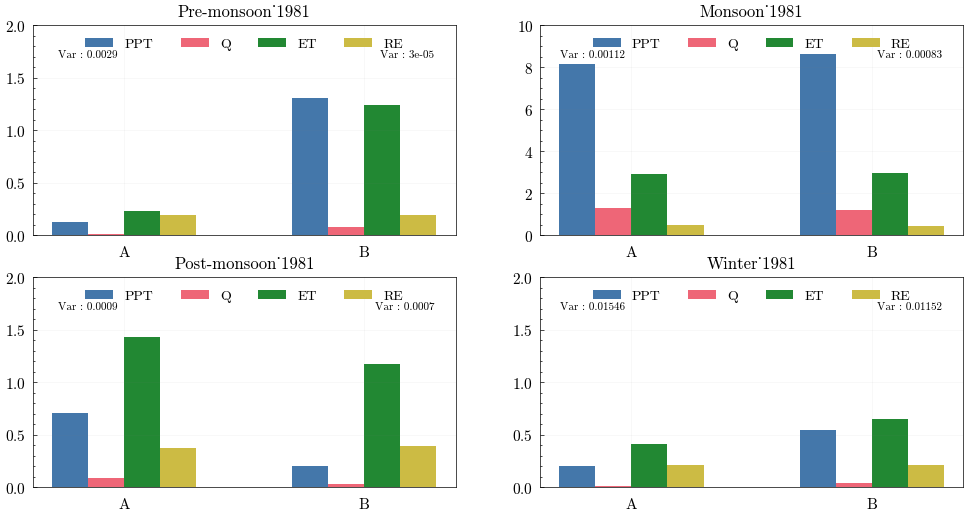

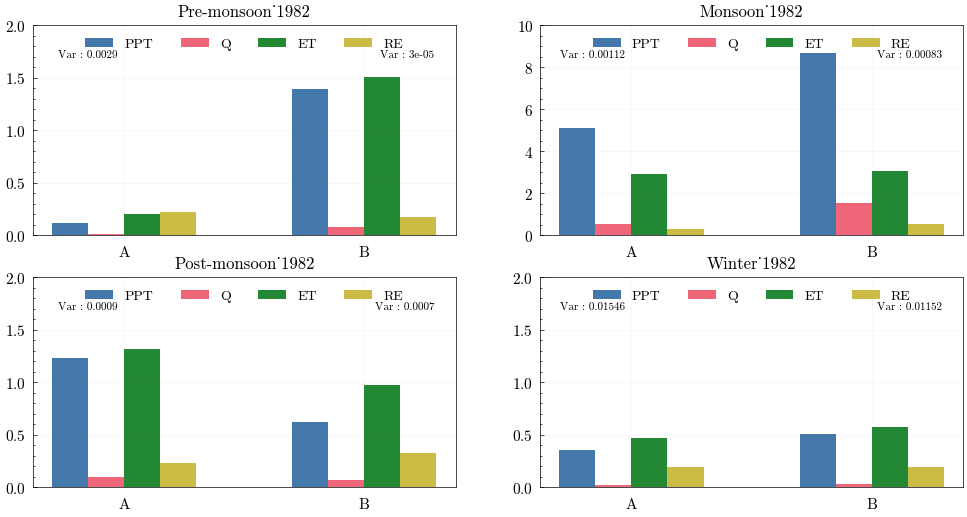

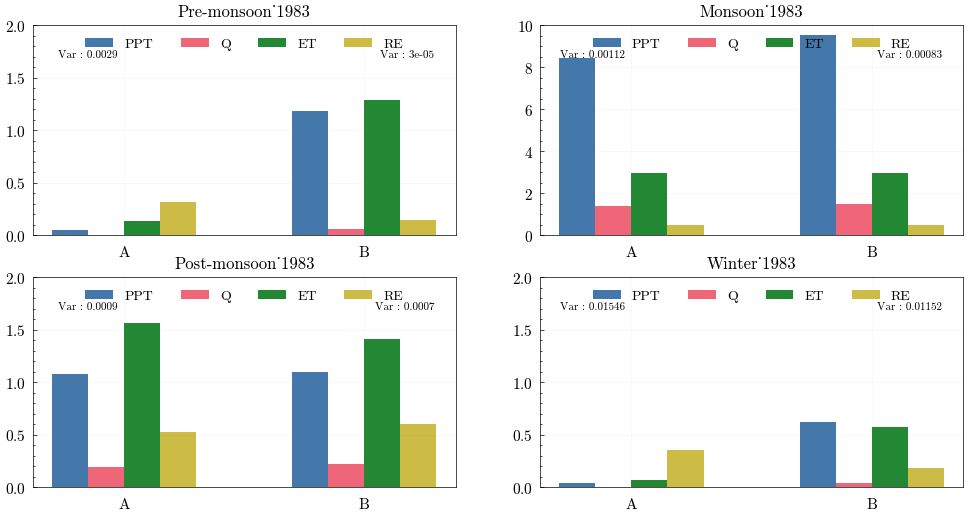

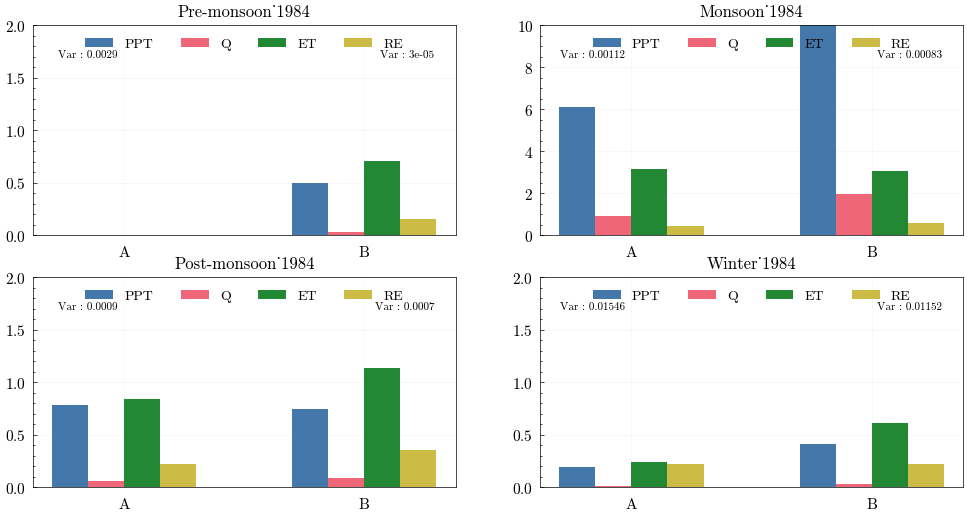

...

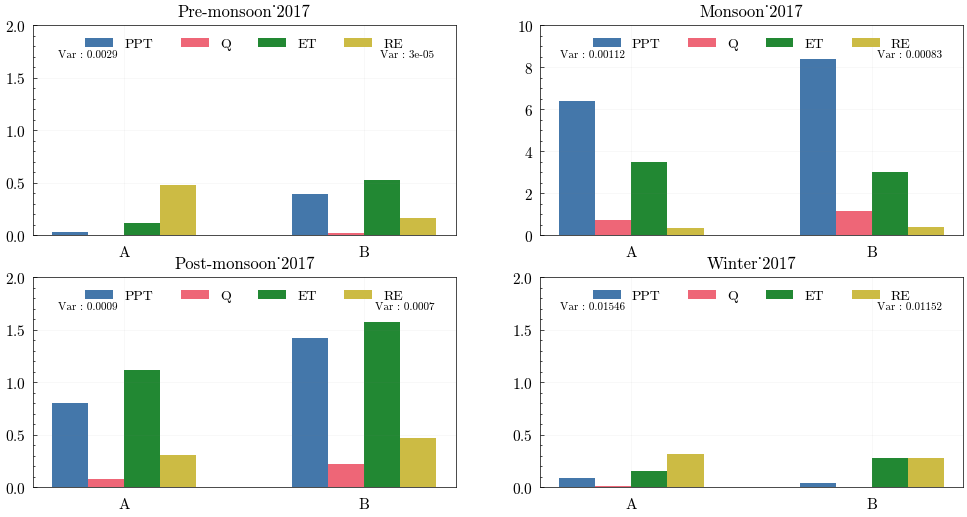

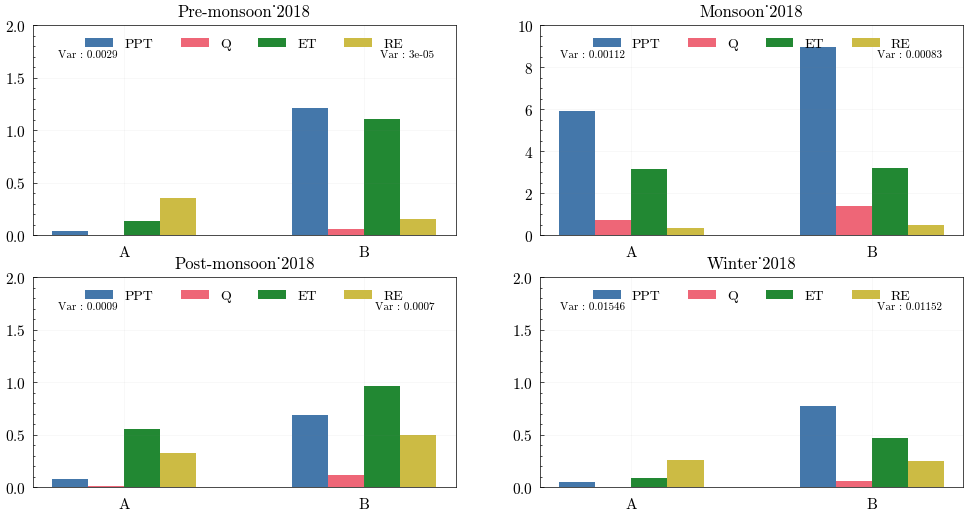

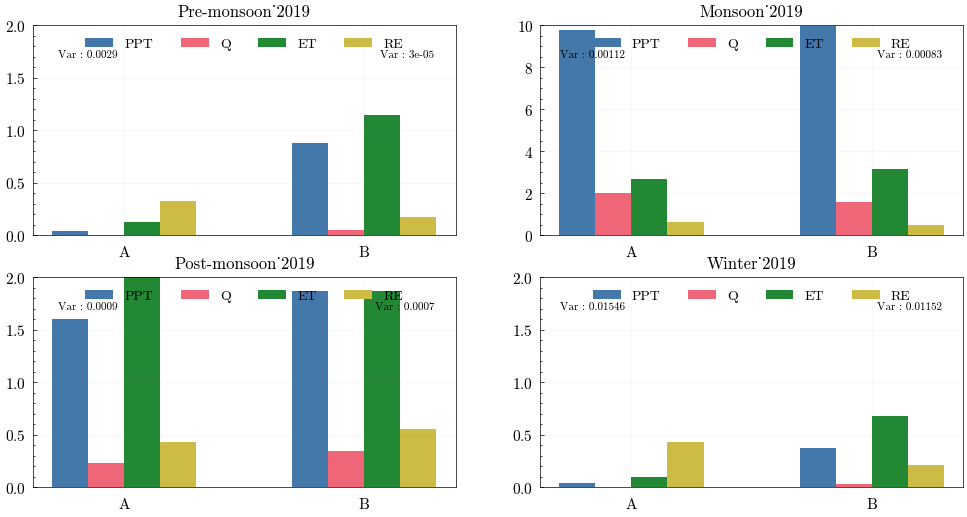

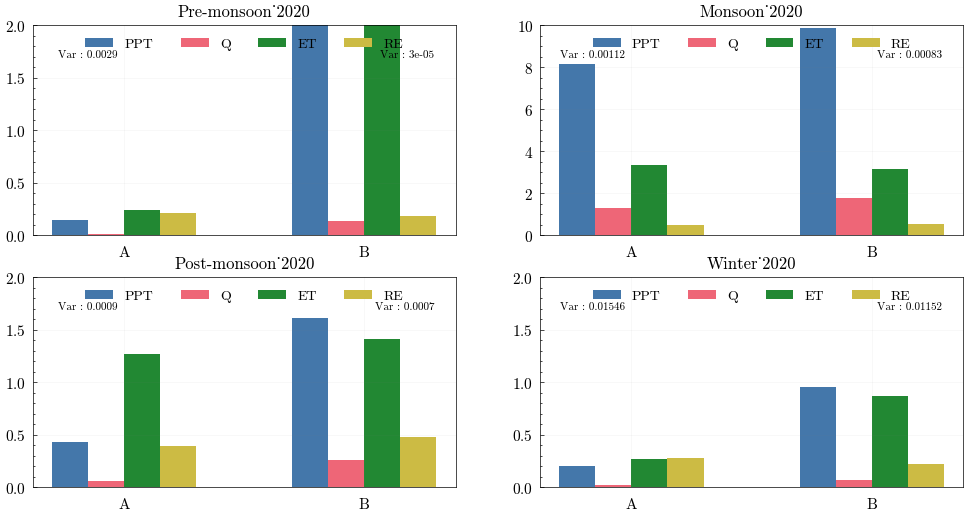

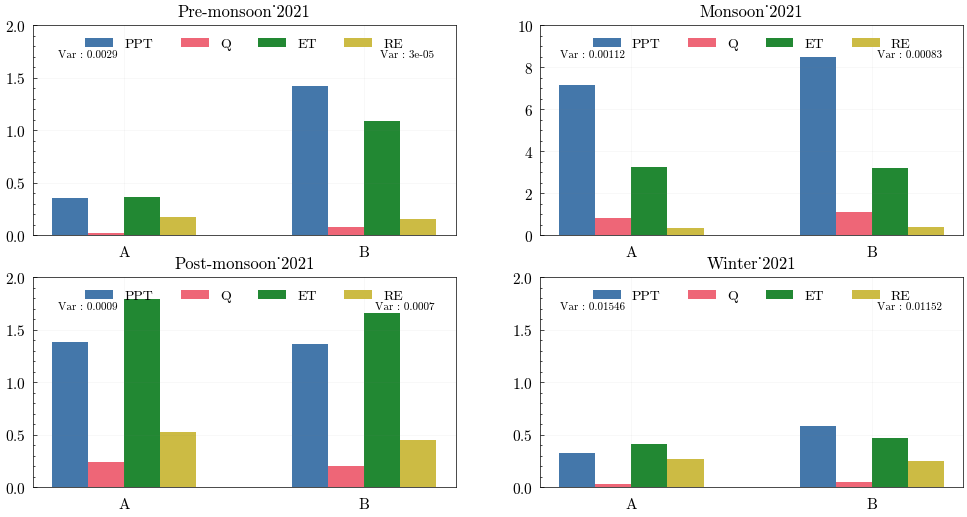

In [216]:
mdl=1

for i in range(42):
    
    fig,axs=plt.subplots(2,2,figsize=(12,6))
    axs=axs.flatten()
    
    for ss in range(4):
        ds=lsm_M
        ds=ds.sel(time=ds["time.month"].isin(ssn_m[ss]))
        ds=ds.groupby("time.year").mean(dim="time")
        
        
        tm=ds['year'].values
        ppt=pd.DataFrame()
        q=pd.DataFrame()
        et=pd.DataFrame()
        re=pd.DataFrame()
        var=[0,0]
        
        for rg in range(2):
    
            
            min_lon, max_lon = reg_lon[rg][0],reg_lon[rg][1]
            min_lat, max_lat = reg_lat[rg][0],reg_lat[rg][1]
            ds_sliced = ds.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
            ds_ts=ds_sliced.mean(dim=['lat','lon']).compute()
            RE=ds_ts["Qs_tavg"]/ds_ts["TotalPrecip_tavg"]
            ds_ts['RE']=RE
            ds_ts=ds_ts.where(ds_ts['RE']<0.8,0)
            var[rg]=np.round(ds_ts['RE'].var().values,5)
            
            ds_ts=ds_ts.isel(year=i)
            
            ppt.loc[1,rg]=ds_ts['TotalPrecip_tavg']
            q.loc[1,rg]=ds_ts['Qs_tavg']
            re.loc[1,rg]=ds_ts['RE']*3
            et.loc[1,rg]=ds_ts['Evap_tavg']
        
        y_limit=np.quantile(np.array(ds['TotalPrecip_tavg'].mean(dim=['lat','lon']).compute()).flatten(),0.99)
        plot(axs[ss],ppt,q,et,re,var,ss,y_limit,tm[i])
        
    plt.savefig(f'2_RE analysis/outputs/Gifs/bar_{tm[i]}.png')
            

In [217]:
#GIF MAKING
import imageio
images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{tm[i]}.png') for i in range(42)]
imageio.mimsave(f'2_RE analysis/outputs/gif_ALL seasons.gif', images,duration=380,loop=0) 

C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\1017863214.py:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{tm[i]}.png') for i in range(42)]


### MAP function

In [215]:
def plot(ax,ppt,q,et,re,var,ss,y_limit,yr):

    import matplotlib.pyplot as plt
    import numpy as np
    import scienceplots
    plt.style.use(['science','no-latex','bright'])
    
    # Sample data
    categories = ['A', 'B']  
    ssn=['Pre-monsoon','Monsoon','Post-monsoon','Winter']
    y_limit=[2,10,2,2]
    y_limit=y_limit[ss]
    
    # Set the positions of the bars on the x-axis
    x = np.arange(len(categories))
    width = 0.15
    #[ax.set_linewidth(0.6) for x in ax.spines.values()]
    
    # Plotting the bars
    ax.bar(x - 0.225, ppt.iloc[0,:], width, label='PPT')
    ax.bar(x - 0.075, q.iloc[0,:], width, label='Q')
    ax.bar(x + 0.075, et.iloc[0,:], width, label='ET')
    ax.bar(x + 0.225, re.iloc[0,:], width, label='RE')
    
    # Adding labels, title, and custom x-axis tick labels
   
    #ax.set_xlabel('$\mathbf{Region}$',fontsize=15, color='Black')
    #ax.set_ylabel('$\mathbf{Value}$',fontsize=15, color='Black')
    ax.set_title(f'{ssn[ss]}_{yr}')
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend()
    
    # Additional settings
    #plt.xticks(np.arange(1980, 2020+1, 5.0),fontsize=8)
    ax.grid(True, color='grey', alpha=0.08)
    ax.set_ylim(0, y_limit)
    
    ax.xaxis.set_tick_params(which='both', bottom=False, top=False,labelsize=11,pad=8)
    ax.yaxis.set_tick_params(which='both', left=True, right=False,labelsize=11,pad=5)
    
    # Move legend outside
    ax.legend(loc='upper center',ncol=4)
    
    
    ax.text(0.2, 0.88, f'Var : {var[0]}', fontsize=8, color='black',ha='right', va='top', transform=ax.transAxes)
    ax.text(0.95, 0.88, f'Var : {var[1]}', fontsize=8, color='black',ha='right', va='top', transform=ax.transAxes)
              

    

C:\Users\sstar\AppData\Local\Temp\ipykernel_12920\3658825752.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(f'2_RE analysis/outputs/Gifs/bar_{ssn[ss]}_{i}.png') for i in range(42)]
